In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import Model,layers
from PIL import Image
import os
import keras

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import shutil
shutil.copyfile('/content/drive/MyDrive/Abc/apple_dataset_easy.zip','./apple_dataset_easy.zip')

'./apple_dataset_easy.zip'

In [ ]:
import zipfile

zip=zipfile.ZipFile('apple_dataset_easy.zip','r')
zip.extractall()

In [ ]:
train_image_dir='apple_dataset/train/images/'
train_annotations_dir='apple_dataset/train/annotations/'

val_image_dir='apple_dataset/validation/images/'
val_annotations_dir='apple_dataset/validation/annotations/'

In [ ]:
!curl -L "https://public.roboflow.com/ds/dvrTZ36CwY?key=8lLWMJPrLs" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   887  100   887    0     0   1283      0 --:--:-- --:--:-- --:--:--  1283
100 18.2M  100 18.2M    0     0  15.9M      0  0:00:01  0:00:01 --:--:--  441M
Archive:  roboflow.zip
replace README.dataset.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: README.dataset.txt      
replace README.roboflow.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/0b47311f426ff926578c9d738d683e76_jpg.rf.40183eae584a653181bbd795ba3c353f.jpg  
 extracting: test/0b47311f426ff926578c9d738d683e76_jpg.rf.40183eae584a653181bbd795ba3c353f.xml  
 extracting: test/1c0060ef868bdc326ce5e6389cb6732f_jpg.rf.f02cd668d26a53d9bf001497992b3657.jpg  
 extracting: test/1c0060ef868bdc326ce5e6389cb6732f_jpg.rf.f02cd668d26a53d9bf001497992b3657.xml  
 extracting: test/2f6fb003bb89cd401322a53

face mask dataset

In [ ]:
!curl -L "https://app.roboflow.com/ds/JHoz0RiQus?key=L6y53uhRd1" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
# #augmentation

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   886  100   886    0     0   1251      0 --:--:-- --:--:-- --:--:--  1249
100 32.5M  100 32.5M    0     0  8715k      0  0:00:03  0:00:03 --:--:-- 11.1M
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/0_Concern-In-China-As-Mystery-Virus-Spreads_jpg.rf.1d13317de1e4da209ba566b4acba5e0b.jpg  
 extracting: test/0_Concern-In-China-As-Mystery-Virus-Spreads_jpg.rf.1d13317de1e4da209ba566b4acba5e0b.xml  
 extracting: test/1224331650_g_400-w_g_jpg.rf.ac3d533cf6d39adc53a89daa813ba222.jpg  
 extracting: test/1224331650_g_400-w_g_jpg.rf.ac3d533cf6d39adc53a89daa813ba222.xml  
 extracting: test/126202-untitled-design-13_jpg.rf.d9c40f748a5f8ddee298fe4b25121045.jpg  
 extracting: test/126202-untitled-design-13_jpg.rf.d9c40f748a5f8ddee298fe4b25121045.xml  
 extracting: test/1288126-10255706714j

In [ ]:
# !curl -L "https://public.roboflow.com/ds/DTD4q08DOa?key=FPI6i0iPRE" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

In [ ]:
import os 

os.makedirs('train/images/')
os.makedirs('train/annotations/')

In [ ]:
import shutil
all=os.listdir('train/')
for name in all:
  #print(name[-3:None])
  if(name[-3:None]=='jpg'):
    shutil.move(os.path.join('train/',name) , 'train/images/')
  if(name[-3:None]=='xml'):
    shutil.move(os.path.join('train/',name) , 'train/annotations/')

In [ ]:
os.makedirs('valid/images/')
os.makedirs('valid/annotations/')

In [ ]:
import os 
import shutil
all=os.listdir('valid/')
for name in all:
  #print(name[-3:None])
  if(name[-3:None]=='jpg'):
    shutil.move(os.path.join('valid/',name) , 'valid/images/')
  if(name[-3:None]=='xml'):
    shutil.move(os.path.join('valid/',name) , 'valid/annotations/')

In [ ]:
train_image_dir='train/images/'
train_annotations_dir='train/annotations/'

val_image_dir='valid/images/'
val_annotations_dir='valid/annotations/'

In [ ]:
import os
len(os.listdir(train_image_dir))

606

In [ ]:
def get_bounding_box(train_annotations_dir):
  train_annotations_path=[]
  for file in os.listdir(train_annotations_dir):
    annotations=os.path.join(train_annotations_dir,file)
    #print(annotations)
    if (annotations[-3:None]=='xml'):
      if os.path.exists(annotations):
        train_annotations_path.append(annotations)
    # print(open(annotations,'r'))
  return train_annotations_path

In [ ]:
get_bounding_box(train_annotations_dir)

['train/annotations/IMG_0318_JPG.rf.8d091ab4bbe2cd70b92ad64592315ac8.xml',
 'train/annotations/3e8fb24addda1a0945bd6b7777bc4018_jpg.rf.f842c9757bdb85fddeddce5fddd65bc0.xml',
 'train/annotations/IMG_0295_JPG.rf.32f999d96696f80ebe62ade6437b2fe2.xml',
 'train/annotations/3730ef213ac6aad431475a9ab28f349a_jpg.rf.077f757828e9ff709c4e1e8b90f2bd52.xml',
 'train/annotations/0301b7f9ed4d5ba503fda79fc4370c29_jpg.rf.7871491670bed0423e3beceb3fae8016.xml',
 'train/annotations/b5102d7f9740eee7754ed268becb2163_jpg.rf.b40f1fbd9b2855b7fa5234eb32c8bb15.xml',
 'train/annotations/8de03901c64a80070048ead3fb0d32bd_jpg.rf.3bdcf5223918218765c685e65d8efd1e.xml',
 'train/annotations/c0d68e012bb93c14bc333fc1d5e52621_jpg.rf.7a3c7ca8c5ccc4d7b307f188bbfb0c85.xml',
 'train/annotations/f02d615907c77dc15f02bd1372e4398f_jpg.rf.8557a2e6c1a157a570333dd454271cb0.xml',
 'train/annotations/97aeb1f9b745a929e9ac0848acb53a1a_jpg.rf.3284f8666d6a9be6075774c73ec06ac4.xml',
 'train/annotations/22e74efb18b2d88fba63d25a61bf5f97_jpg.r

In [ ]:
# # importing element tree
# # under the alias of ET
# import xml.etree.ElementTree as ET

# # Passing the path of the
# # xml document to enable the
# # parsing process
# parser = ET.XMLParser(encoding="utf-8")
# tree = ET.parse('apple_dataset/train/annotations/damaged_apple (199).xml',parser=parser)

# print(tree) 
# # getting the parent tag of
# # the xml document
# #root = tree.getroot()
  
# # printing the root (parent) tag
# # of the xml document, along with
# # its memory location
# #print(root)
  
# # printing the attributes of the
# # first tag from the parent 
# #print(root[:])



# elemList = []

# for elem in root.iter():
#     elemList.append(elem.tag)
# #print(elemList)
# # printing the text contained within
# # first subtag of the 5th tag from
# # the parent
# print(root[2].text)
# print(root[:][0].text)
# root.get

In [ ]:
# pip install xmltodict

In [ ]:
# import xmltodict

# filetext=open('apple_dataset/train/annotations/damaged_apple (199).xml',encoding='UTF-8')
# xmltodict.parse(filetext)

In [ ]:
targetsize=416
numofgrids=13
labels=['white-king','white-queen','white-bishop','white-knight','white-rook','white-pawn','black-king','black-queen','black-bishop','black-knight','black-rook','black-pawn']
#labels=['damaged_apple','apple']
color_list=np.array([[255,255,255],
                     [255,255,0],
                     [255,255,255],
                     [255,255,255],
                     [255,255,255],
                     [255,255,255],
                     [0,0,0],
                     [0,0,255],
                     [0,0,0],
                     [0,0,0],
                     [0,0,0],
                     [0,0,0],
                    ])

annotation to labels function 

In [ ]:
def one_labels(path,targetsize,numofgrids,labels):
  import xml.dom.minidom
  detailsdict={}
  classes={}
  for l in labels:
    classes[l]=0
  print(path)
  xmlfile = xml.dom.minidom.parse(path)
  nameatributes=xmlfile.getElementsByTagName('name')
  #print(nameatributes)
  i=0
  y_matrix=[]
  for atri in nameatributes:
    #print(atri.firstChild.nodeValue)

    for idx,l in enumerate(labels):
      if(atri.firstChild.nodeValue==l):
        y_matrix.append(idx)
        classes[l]+=1
        i+=1
    
    # if(atri.firstChild.nodeValue=='apple'):
    #   y_matrix.append(1)
    # else:
    #   y_matrix.append(0)

    detailsdict[i]=atri.firstChild.nodeValue
    
  print(y_matrix)
  print(i)
  #input('abc')
# y_matrix=np.array(y_matrix)
# y_matrix=np.reshape(y_matrix,[i,1])
  width=xmlfile.getElementsByTagName('width')
  for atri in width:
    width=atri.firstChild.nodeValue
  print('\nWidth:',width)

  height=xmlfile.getElementsByTagName('height')
  for atri in height:
    height=atri.firstChild.nodeValue
  print('Height:',height,'\n')

  xscale=targetsize/int(width)
  yscale=targetsize/int(height)
  #print("xscale ",xscale,'yscale ',yscale)

  xminatri=xmlfile.getElementsByTagName('xmin')
  c=0
  for atri in xminatri:
    #print(atri.firstChild.nodeValue)
    y_matrix.append(xscale*int(atri.firstChild.nodeValue))
    c+=1
    if c>i:
      print('#'*30,'\n',path)
  

  yminatri=xmlfile.getElementsByTagName('ymin')
  for atri in yminatri:
    #print(atri.firstChild.nodeValue)
    y_matrix.append(yscale*int(atri.firstChild.nodeValue))

  xmaxatri=xmlfile.getElementsByTagName('xmax')
  for atri in xmaxatri:
    #print(atri.firstChild.nodeValue)
    y_matrix.append(xscale*int(atri.firstChild.nodeValue))

  ymaxatri=xmlfile.getElementsByTagName('ymax')
  for atri in ymaxatri:
    #print(atri.firstChild.nodeValue)
    y_matrix.append(yscale*int(atri.firstChild.nodeValue))


  y_matrix=np.array(y_matrix)
  #print(y_matrix,'see')
  y_matrix=np.reshape(y_matrix,[5,i]).T
  #print(y_matrix,'see')
  #this is to compute x y w h
  y_matrix_xywh=np.zeros(y_matrix.shape)
  y_matrix_xywh[:,0]=y_matrix[:,0]
  for idx in range(y_matrix.shape[0]):
    y_matrix_xywh[idx,1]=(y_matrix[idx,1]+y_matrix[idx,3])/2 #compute x ,center of the box

    y_matrix_xywh[idx,2]=(y_matrix[idx,2]+y_matrix[idx,4])/2 #compute y ,center of the box

    y_matrix_xywh[idx,3]=np.abs(y_matrix[idx,1]-y_matrix[idx,3]) #compute width of the box

    y_matrix_xywh[idx,4]=np.abs(y_matrix[idx,2]-y_matrix[idx,4]) #compute height of the box
  
  demo=len(labels)
  demo=np.arange(0,demo)
  labelsvec=keras.utils.to_categorical(demo)
  #print("vec",labelsvec)
  # numofgrids=5
  gridsize=targetsize/numofgrids

  yfinalwh=np.zeros([numofgrids,numofgrids,5+len(labels)]) # 7 because pc + x,y,h,w=5+num of classes
  check=0
  for i in range(1,(numofgrids+1)):
    ymin,ymax=(gridsize*(i-1)),(gridsize*i)
    for j in range(1,(numofgrids+1)):
        xmin,xmax=(gridsize*(j-1)),(gridsize*j)
        #print('start',"(",xmin,",",ymin,") ",'end',"(",xmax,",",ymax,") ")
        check=0
        for k in range(y_matrix_xywh.shape[0]):
        
          if ((y_matrix_xywh[k,1]>=xmin and y_matrix_xywh[k,1]<xmax) and (y_matrix_xywh[k,2]>=ymin and y_matrix_xywh[k,2]<ymax)):
            check+=1
            #print(y_matrix_xywh[k,1],',',y_matrix_xywh[k,2],' in (',xmin,',',ymin,') (',xmax,',',ymax,')')
            #print(y_matrix_xywh[k,1],',',y_matrix_xywh[k,2])
            if(check>=1):
              print(check,'objects in ',i-1,",",j-1)
              if(check>1):
                print(path,'see this')
            yfinalwh[i-1,j-1,0]=1
            yfinalwh[i-1,j-1,1]=(y_matrix_xywh[k,1]-xmin)/gridsize
            yfinalwh[i-1,j-1,2]=(y_matrix_xywh[k,2]-ymin)/gridsize
            yfinalwh[i-1,j-1,3]=y_matrix_xywh[k,3]/gridsize
            yfinalwh[i-1,j-1,4]=y_matrix_xywh[k,4]/gridsize
            for l in range(len(labels)):
              if (y_matrix_xywh[k,0]==l):
                print("class:",l,labels[l])
                yfinalwh[i-1,j-1,5:]=labelsvec[l,:]
              
            # if (y_matrix_xywh[k,0]==0):
            #   yfinalwh[i-1,j-1,5]=1
            #   yfinalwh[i-1,j-1,6]=0
            # else:
            #   yfinalwh[i-1,j-1,5]=0
            #   yfinalwh[i-1,j-1,6]=1
  #print(classes,'see')
  #print(yfinalwh)
  #tru=yfinalwh[:,:,0]==1
  # print(len(tru),'len')
  #print(yfinalwh[tru],'true')
  # y_finalwh=np.concatenate([yfinalwh[tru],labelsvec],axis=1)
  # print(yfinalwh,':)')
  return yfinalwh,xscale,yscale,classes

test try:

In [ ]:
#y,xs,ys=one_labels('apple_dataset/train/annotations/apple--7-_jpg.rf.134ed73d1f6f518d81565a8e22f12aee.xml',targetsize,numofgrids)
y,xs,ys,total=one_labels(get_bounding_box(train_annotations_dir)[0],targetsize,numofgrids,labels)
print(y.shape)
print(y[2,3,:])
print(xs," ",ys)
print(total)

train/annotations/IMG_0318_JPG.rf.8d091ab4bbe2cd70b92ad64592315ac8.xml
[10]
1

Width: 416
Height: 416 

1 objects in  2 , 7
class: 10 black-rook
(13, 13, 17)
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
1.0   1.0
{'white-king': 0, 'white-queen': 0, 'white-bishop': 0, 'white-knight': 0, 'white-rook': 0, 'white-pawn': 0, 'black-king': 0, 'black-queen': 0, 'black-bishop': 0, 'black-knight': 0, 'black-rook': 1, 'black-pawn': 0}


lets make a list to labels function

In [ ]:
def listtolabels(annotations,targetsize,numofgrids,labels):
  yfinal=np.zeros([len(annotations),numofgrids,numofgrids,5+len(labels)])
  labels_count={}
  for l in labels:
    labels_count[l]=0
  for i,path in enumerate(annotations):
    y,_,_,classes=one_labels(path,targetsize,numofgrids,labels)
    yfinal[i,:,:,:]=y
    for l in labels:
      labels_count[l]+=classes[l]
    #print(i)
  return yfinal,labels_count
  

In [ ]:
# print(y_train.shape)
# #print(y_val.shape)

In [ ]:
def gettrainingimagenames(train_annotations_dir,train_image_dir):
  train_img_path=[]
  for file in os.listdir(train_annotations_dir):
    annotations=os.path.join(train_image_dir,file)
    annotations=annotations[:-4]+'.jpg'
    # print(annotations)
    if os.path.exists(annotations):
      train_img_path.append(annotations)
    # print(open(annotations,'r'))
  return train_img_path

In [ ]:
def loadimg(loadfileslist,targetsize):
  xtrain=np.zeros([len(loadfileslist),targetsize,targetsize,3])
  imgarr=[]
  for i,path in enumerate(loadfileslist):
    print(i)
    img=Image.open(path)
    img=img.resize([targetsize,targetsize])
    #img.show()
    imgarr=np.array(img)
    xtrain[i,:,:,:]=imgarr
  return xtrain

validation set

In [ ]:
y_val,total=listtolabels(get_bounding_box(val_annotations_dir),targetsize,numofgrids,labels)
vallist=gettrainingimagenames(val_annotations_dir,val_image_dir)
x_val=loadimg(vallist,targetsize)
x_val=np.uint8(x_val)
print(total)

valid/annotations/IMG_0310_JPG.rf.fa4dfa05ea9b136a2afc53556d90adb9.xml
[6, 10, 9, 11, 11, 8, 8, 0, 5, 1, 3, 2, 2]
13

Width: 416
Height: 416 

1 objects in  0 , 6
class: 2 white-bishop
1 objects in  1 , 2
class: 3 white-knight
1 objects in  1 , 4
class: 8 black-bishop
1 objects in  1 , 5
class: 1 white-queen
1 objects in  2 , 8
class: 10 black-rook
1 objects in  3 , 10
class: 6 black-king
1 objects in  4 , 6
class: 11 black-pawn
1 objects in  5 , 2
class: 0 white-king
1 objects in  7 , 4
class: 5 white-pawn
1 objects in  7 , 6
class: 8 black-bishop
1 objects in  7 , 9
class: 11 black-pawn
1 objects in  8 , 2
class: 2 white-bishop
1 objects in  9 , 8
class: 9 black-knight
valid/annotations/IMG_0320_JPG.rf.2a69b00c4e2299736c81954089818448.xml
[10]
1

Width: 416
Height: 416 

1 objects in  4 , 5
class: 10 black-rook
valid/annotations/33b66ede234715fb46db40b33c4e26c1_jpg.rf.d931a220452e1914ad5a8cf80bdd5b9a.xml
[3]
1

Width: 416
Height: 416 

1 objects in  10 , 1
class: 3 white-knight
valid

train set

In [ ]:
y_train,total=listtolabels(get_bounding_box(train_annotations_dir),targetsize,numofgrids,labels)
loadfileslist=gettrainingimagenames(train_annotations_dir,train_image_dir)
x_train=loadimg(loadfileslist,targetsize)
x_train=np.uint8(x_train)
print(total)

Streaming output truncated to the last 5000 lines.
1 objects in  4 , 4
class: 3 white-knight
1 objects in  4 , 6
class: 8 black-bishop
1 objects in  4 , 8
class: 9 black-knight
1 objects in  4 , 9
class: 11 black-pawn
1 objects in  4 , 10
class: 9 black-knight
1 objects in  5 , 2
class: 0 white-king
1 objects in  5 , 3
class: 5 white-pawn
1 objects in  5 , 7
class: 11 black-pawn
1 objects in  5 , 9
class: 7 black-queen
1 objects in  7 , 5
class: 5 white-pawn
1 objects in  7 , 7
class: 11 black-pawn
1 objects in  7 , 10
class: 9 black-knight
1 objects in  8 , 2
class: 2 white-bishop
1 objects in  8 , 3
class: 5 white-pawn
1 objects in  8 , 7
class: 11 black-pawn
1 objects in  10 , 4
class: 4 white-rook
1 objects in  10 , 6
class: 5 white-pawn
1 objects in  10 , 9
class: 11 black-pawn
1 objects in  10 , 11
class: 10 black-rook
train/annotations/03886821377011fec599e8fa12d86e89_jpg.rf.44fb00bcea92435e28c1ea1a89595b32.xml
[11]
1

Width: 416
Height: 416 

1 objects in  6 , 6
class: 11 black

In [ ]:
print(x_train.shape)
print(y_train.shape)

(606, 416, 416, 3)
(606, 13, 13, 17)


In [ ]:
# {'no-mask': 123, 'mask': 573}

In [ ]:
len(get_bounding_box(train_annotations_dir))

606

num:1
(416, 416, 3)


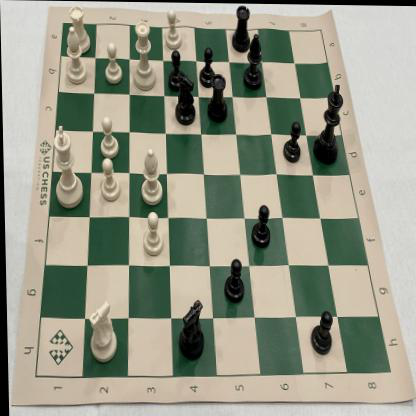

In [ ]:
num=int(input("num:"))
testex=x_train[num,:,:,:]
print(testex.shape)
Image.fromarray(testex)

In [ ]:
print(y_train[num,:,:,0])

[[0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]


In [ ]:
# x_input=layers.Input(shape=(100,100,3))
# x=layers.Conv2D(32,(3,3),activation='relu')(x_input)
# x=layers.Conv2D(64,(5,5),activation='relu')(x)
# x=layers.Conv2D(64,(7,7),activation='relu')(x)
# x=layers.MaxPooling2D((2,2))(x)
# x=layers.Conv2D(32,(7,7),activation='relu')(x)
# x=layers.MaxPooling2D((2,2))(x)
# x=layers.Conv2D(16,(7,7),activation='relu')(x)
# x=layers.Conv2D(7,(4,4),activation='relu')(x)
# x=layers.MaxPooling2D((2,2))(x)
# output=layers.Conv2D(7,(1,1),activation='sigmoid')(x)

# model=Model(inputs=x_input,outputs=output)
# model.summary()

In [ ]:
# x_input=layers.Input(shape=(100,100,3))
# x=layers.Conv2D()

In [ ]:
#normalize the inputs
def norm(x):
  return (x/255)

# x_train=norm(x_train)
# x_val=norm(x_val)

In [ ]:
# x_input=layers.Input(shape=(targetsize,targetsize,3))
# x=layers.Conv2D(32,(7,7))(x_input)
# x=layers.BatchNormalization()(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# x=layers.MaxPooling2D((2,2))(x)
# #x=layers.Dropout(0.7)(x)

# x=layers.Conv2D(64,(5,5))(x)
# x=layers.BatchNormalization()(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# x=layers.MaxPooling2D((2,2))(x)
# # x=layers.Dropout(0.7)(x)

# x=layers.Conv2D(128,(3,3))(x)
# x=layers.BatchNormalization()(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# x=layers.MaxPooling2D((2,2))(x)
# # x=layers.Dropout(0.7)(x)

# x=layers.Conv2D(256,(3,3))(x)
# x=layers.BatchNormalization()(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# x=layers.MaxPooling2D((2,2))(x)
# # x=layers.Dropout(0.7)(x)

# x=layers.Conv2D(512,(3,3))(x)
# x=layers.BatchNormalization()(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# x=layers.MaxPooling2D((2,2))(x)
# # x=layers.Dropout(0.5)(x)

# x=layers.Conv2D(512,(3,3))(x)
# x=layers.BatchNormalization()(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# x=layers.MaxPooling2D((2,2))(x)
# # x=layers.Dropout(0.5)(x)

# x=layers.Flatten()(x)

# x=layers.Dense(256)(x)
# # x=layers.Dropout(0)(x)

# x=layers.Dense(256)(x)
# # x=layers.Dropout(0)(x)

# x=layers.Dense((numofgrids*numofgrids)*7,activation='linear')(x)
# output=layers.Reshape((numofgrids,numofgrids,7))(x)

# model=Model(inputs=x_input,outputs=output)
# model.summary()

In [ ]:
# x_input=layers.Input(shape=(targetsize,targetsize,3))
# x=layers.Conv2D(32,(3,3),padding='same',kernel_initializer=keras.initializers.he_uniform())(x_input)
# x=layers.Conv2D(64,(3,3),kernel_initializer=keras.initializers.he_uniform())(x)
# x=layers.BatchNormalization()(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# x=layers.MaxPooling2D((2,2))(x)
# skip1=x                #################################first skip connection                       #
#                                                                                                     #
# x=layers.Conv2D(64,(1,1),padding='valid',kernel_initializer=keras.initializers.he_uniform())(x)     #
# x=layers.BatchNormalization()(x)                                                                    #
# x=layers.LeakyReLU(alpha=0.1)(x)                                                                  
# x=layers.Conv2D(64,(3,3),padding='same',kernel_initializer=keras.initializers.he_uniform())(x)
# x=layers.BatchNormalization()(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# #x=layers.Dropout(0.8)(x)

# x=layers.Conv2D(64,(1,1),padding='valid',kernel_initializer=keras.initializers.he_uniform())(x)
# #x=layers.add([skip1,x])#################################first skip connection
# x=layers.BatchNormalization()(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# x=layers.Conv2D(128,(3,3),padding='same',kernel_initializer=keras.initializers.he_uniform())(x)
# x=layers.BatchNormalization()(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# x=layers.MaxPooling2D((2,2))(x)
# #x=layers.Dropout(0.8)(x)
# skip2=x#################################second skip connection

# x=layers.Conv2D(128,(1,1),padding='valid',kernel_initializer=keras.initializers.he_uniform())(x)
# x=layers.BatchNormalization()(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# x=layers.Conv2D(128,(3,3),padding='same',kernel_initializer=keras.initializers.he_uniform())(x)
# x=layers.BatchNormalization()(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# #x=layers.Dropout(0.8)(x)

# x=layers.Conv2D(128,(1,1),padding='valid',kernel_initializer=keras.initializers.he_uniform())(x)
# #x=layers.add([skip2,x])#################################second skip connection
# x=layers.BatchNormalization()(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# x=layers.Conv2D(256,(3,3),padding='same',kernel_initializer=keras.initializers.he_uniform())(x)
# x=layers.BatchNormalization()(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# x=layers.MaxPooling2D((2,2))(x)
# #x=layers.Dropout(0.8)(x)
# skip3=x#################################third skip connection

# x=layers.Conv2D(256,(1,1),padding='valid',kernel_initializer=keras.initializers.he_uniform())(x)
# x=layers.BatchNormalization()(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# x=layers.Conv2D(256,(3,3),padding='same',kernel_initializer=keras.initializers.he_uniform())(x)
# #x=layers.add([skip3,x])#################################third skip connection
# x=layers.BatchNormalization()(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# x=layers.MaxPooling2D((2,2))(x)
# #x=layers.Dropout(0.9)(x)

# x=layers.Flatten()(x)

# x=layers.Dense(128,kernel_initializer=keras.initializers.he_uniform())(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# x=layers.Dropout(0.9)(x)

# x=layers.Dense(128,kernel_initializer=keras.initializers.he_uniform())(x)
# x=layers.LeakyReLU(alpha=0.1)(x)
# x=layers.Dropout(0.9)(x)

# x=layers.Dense((numofgrids*numofgrids)*7,activation='linear')(x)
# output=layers.Reshape((numofgrids,numofgrids,7))(x)

# model=Model(inputs=x_input,outputs=output)
# model.summary()

In [ ]:
# intersection_over_union(K.variable([0.25, 0.15, 0.3, 0.1],dtype='float32'),K.variable([0.25, 0.35, 0.3, 0.1],dtype='float32'))

In [ ]:
##################################################################YOLOV2#############################################################
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Reshape, Activation, Conv2D, Input, MaxPooling2D, BatchNormalization, Flatten, Dense, Lambda, LeakyReLU, concatenate
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
from tensorflow.keras.optimizers import SGD, Adam, RMSprop
import tensorflow.keras.backend as K
import tensorflow as tf

# the function to implement the orgnization layer (thanks to github.com/allanzelener/YAD2K)
def space_to_depth_x2(x):
    return tf.nn.space_to_depth(x, block_size=2)

input_image = Input(shape=(416, 416, 3))
#true_boxes  = Input(shape=(1, 1, 1, TRUE_BOX_BUFFER , 4))

# Layer 1
x = Conv2D(32, (3,3), strides=(1,1), padding='same', name='conv_1', use_bias=False)(input_image)
x = BatchNormalization(name='norm_1')(x)
x = LeakyReLU(alpha=0.1)(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# Layer 2
x = Conv2D(64, (3,3), strides=(1,1), padding='same', name='conv_2', use_bias=False)(x)
x = BatchNormalization(name='norm_2')(x)
x = LeakyReLU(alpha=0.1)(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# Layer 3
x = Conv2D(128, (3,3), strides=(1,1), padding='same', name='conv_3', use_bias=False)(x)
x = BatchNormalization(name='norm_3')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 4
x = Conv2D(64, (1,1), strides=(1,1), padding='same', name='conv_4', use_bias=False)(x)
x = BatchNormalization(name='norm_4')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 5
x = Conv2D(128, (3,3), strides=(1,1), padding='same', name='conv_5', use_bias=False)(x)
x = BatchNormalization(name='norm_5')(x)
x = LeakyReLU(alpha=0.1)(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# Layer 6
x = Conv2D(256, (3,3), strides=(1,1), padding='same', name='conv_6', use_bias=False)(x)
x = BatchNormalization(name='norm_6')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 7
x = Conv2D(128, (1,1), strides=(1,1), padding='same', name='conv_7', use_bias=False)(x)
x = BatchNormalization(name='norm_7')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 8
x = Conv2D(256, (3,3), strides=(1,1), padding='same', name='conv_8', use_bias=False)(x)
x = BatchNormalization(name='norm_8')(x)
x = LeakyReLU(alpha=0.1)(x)
x = MaxPooling2D(pool_size=(2, 2))(x)

# Layer 9
x = Conv2D(512, (3,3), strides=(1,1), padding='same', name='conv_9', use_bias=False)(x)
x = BatchNormalization(name='norm_9')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 10
x = Conv2D(256, (1,1), strides=(1,1), padding='same', name='conv_10', use_bias=False)(x)
x = BatchNormalization(name='norm_10')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 11
x = Conv2D(512, (3,3), strides=(1,1), padding='same', name='conv_11', use_bias=False)(x)
x = BatchNormalization(name='norm_11')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 12
x = Conv2D(256, (1,1), strides=(1,1), padding='same', name='conv_12', use_bias=False)(x)
x = BatchNormalization(name='norm_12')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 13
x = Conv2D(512, (3,3), strides=(1,1), padding='same', name='conv_13', use_bias=False)(x)
x = BatchNormalization(name='norm_13')(x)
x = LeakyReLU(alpha=0.1)(x)

skip_connection = x

x = MaxPooling2D(pool_size=(2, 2))(x)

# Layer 14
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_14', use_bias=False)(x)
x = BatchNormalization(name='norm_14')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 15
x = Conv2D(512, (1,1), strides=(1,1), padding='same', name='conv_15', use_bias=False)(x)
x = BatchNormalization(name='norm_15')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 16
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_16', use_bias=False)(x)
x = BatchNormalization(name='norm_16')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 17
x = Conv2D(512, (1,1), strides=(1,1), padding='same', name='conv_17', use_bias=False)(x)
x = BatchNormalization(name='norm_17')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 18
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_18', use_bias=False)(x)
x = BatchNormalization(name='norm_18')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 19
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_19', use_bias=False)(x)
x = BatchNormalization(name='norm_19')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 20
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_20', use_bias=False)(x)
x = BatchNormalization(name='norm_20')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 21
skip_connection = Conv2D(64, (1,1), strides=(1,1), padding='same', name='conv_21', use_bias=False)(skip_connection)
skip_connection = BatchNormalization(name='norm_21')(skip_connection)
skip_connection = LeakyReLU(alpha=0.1)(skip_connection)
skip_connection = Lambda(space_to_depth_x2)(skip_connection)

x = concatenate([skip_connection, x])

# Layer 22
x = Conv2D(1024, (3,3), strides=(1,1), padding='same', name='conv_22', use_bias=False)(x)
x = BatchNormalization(name='norm_22')(x)
x = LeakyReLU(alpha=0.1)(x)

# Layer 23
x = Conv2D(1 * (4 + 1 + len(labels)), (1,1), strides=(1,1), padding='same', name='conv_23')(x)
output = Reshape((13, 13, 4 + 1 + len(labels)))(x)

# x = Conv2D(4 * (4 + 1 + 2), (1,1), strides=(1,1), padding='same', name='conv_23')(x)
# output = Reshape((13, 13, 4, 4 + 1 + 2))(x)

# small hack to allow true_boxes to be registered when Keras build the model 
# for more information: https://github.com/fchollet/keras/issues/2790
#output = Lambda(lambda args: args[0])([output, true_boxes])

model = Model(input_image, output)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 416, 416, 3) 0                                            
__________________________________________________________________________________________________
conv_1 (Conv2D)                 (None, 416, 416, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
norm_1 (BatchNormalization)     (None, 416, 416, 32) 128         conv_1[0][0]                     
__________________________________________________________________________________________________
leaky_re_lu_22 (LeakyReLU)      (None, 416, 416, 32) 0           norm_1[0][0]                     
____________________________________________________________________________________________

In [ ]:
!wget https://pjreddie.com/media/files/yolov2.weights

--2021-04-29 14:09:53--  https://pjreddie.com/media/files/yolov2.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 203934260 (194M) [application/octet-stream]
Saving to: ‘yolov2.weights.1’

yolov2.weights.1    100%[===================>] 194.49M  63.3MB/s    in 3.1s    

2021-04-29 14:09:56 (63.3 MB/s) - ‘yolov2.weights.1’ saved [203934260/203934260]



In [ ]:
path_to_weight = "./yolov2.weights"

class WeightReader:
    def __init__(self, weight_file):
        self.offset = 4
        self.all_weights = np.fromfile(weight_file, dtype='float32')
        
    def read_bytes(self, size):
        self.offset = self.offset + size
        return self.all_weights[self.offset-size:self.offset]
    
    def reset(self):
        self.offset = 4
                
weight_reader = WeightReader(path_to_weight)
print("all_weights.shape = {}".format(weight_reader.all_weights.shape))

all_weights.shape = (50983565,)


In [ ]:
weight_reader.reset()
nb_conv = 23

for i in range(1, nb_conv+1):
    conv_layer = model.get_layer('conv_' + str(i))
    
    if i < nb_conv:
        norm_layer = model.get_layer('norm_' + str(i))
        
        size = np.prod(norm_layer.get_weights()[0].shape)

        beta  = weight_reader.read_bytes(size)
        gamma = weight_reader.read_bytes(size)
        mean  = weight_reader.read_bytes(size)
        var   = weight_reader.read_bytes(size)

        weights = norm_layer.set_weights([gamma, beta, mean, var])       
        
    if len(conv_layer.get_weights()) > 1:
        bias   = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[1].shape))
        kernel = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
        kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
        kernel = kernel.transpose([2,3,1,0])
        conv_layer.set_weights([kernel, bias])
    else:
        kernel = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
        kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
        kernel = kernel.transpose([2,3,1,0])
        conv_layer.set_weights([kernel])

In [ ]:
layer   = model.layers[-2] # the last convolutional layer
weights = layer.get_weights()

new_kernel = np.random.normal(size=weights[0].shape)/(13*13)
new_bias   = np.random.normal(size=weights[1].shape)/(13*13)

layer.set_weights([new_kernel, new_bias])

In [ ]:
# weights[].shape
for w in weights:
  print(w.shape)

(1, 1, 1024, 17)
(17,)


In [ ]:
import sys
import keras.backend as K
def intersection_over_union(boxes_preds, boxes_labels, box_format="midpoint"):
    """
    Video explanation of this function:
    https://youtu.be/XXYG5ZWtjj0
    This function calculates intersection over union (iou) given pred boxes
    and target boxes.
    Parameters:
        boxes_preds (tensor): Predictions of Bounding Boxes (BATCH_SIZE, 4)
        boxes_labels (tensor): Correct labels of Bounding Boxes (BATCH_SIZE, 4)
        box_format (str): midpoint/corners, if boxes (x,y,w,h) or (x1,y1,x2,y2)
    Returns:
        tensor: Intersection over union for all examples
    """

    if box_format == "midpoint":
        box1_x1 = boxes_preds[..., 0:1] - boxes_preds[..., 2:3] / 2
        box1_y1 = boxes_preds[..., 1:2] - boxes_preds[..., 3:4] / 2
        box1_x2 = boxes_preds[..., 0:1] + boxes_preds[..., 2:3] / 2
        box1_y2 = boxes_preds[..., 1:2] + boxes_preds[..., 3:4] / 2
        box2_x1 = boxes_labels[..., 0:1] - boxes_labels[..., 2:3] / 2
        box2_y1 = boxes_labels[..., 1:2] - boxes_labels[..., 3:4] / 2
        box2_x2 = boxes_labels[..., 0:1] + boxes_labels[..., 2:3] / 2
        box2_y2 = boxes_labels[..., 1:2] + boxes_labels[..., 3:4] / 2
    #print("tada")
    #print(box1_x1,',',box1_y1,' ',box1_x2,',',box1_y2,'\n\n')  
    if box_format == "corners":
        box1_x1 = boxes_preds[..., 0:1]
        box1_y1 = boxes_preds[..., 1:2]
        box1_x2 = boxes_preds[..., 2:3]
        box1_y2 = boxes_preds[..., 3:4]
        box2_x1 = boxes_labels[..., 0:1]
        box2_y1 = boxes_labels[..., 1:2]
        box2_x2 = boxes_labels[..., 2:3]
        box2_y2 = boxes_labels[..., 3:4]
    #print("box1_x1",box1_x1,"box2_x1",box2_x1)
    #x1 = torch.max(box1_x1, box2_x1)
    x1 = K.max(K.concatenate([box1_x1,box2_x1]),axis=-1)
    #y1 = torch.max(box1_y1, box2_y1)
    y1 = K.max(K.concatenate([box1_y1,box2_y1]),axis=-1)
    #x2 = torch.min(box1_x2, box2_x2)
    x2 = K.min(K.concatenate([box1_x2,box2_x2]),axis=-1)
    #y2 = torch.min(box1_y2, box2_y2)
    y2 = K.min(K.concatenate([box1_y2,box2_y2]),axis=-1)
    #print("x1",x1)
    #print(x1,',',x2,' ',y1,',',y2)
    intersection = K.clip((x2 - x1),min_value=0,max_value=None) * K.clip((y2 - y1),min_value=0,max_value=None)
    #print('inter',intersection)
    #intersection=K.reshape(intersection,[intersection.shape[0],1])
    intersection=K.expand_dims(intersection,axis=-1)
    #print('interwith1',intersection)
    box1_area = abs((box1_x2 - box1_x1) * (box1_y2 - box1_y1))
    box2_area = abs((box2_x2 - box2_x1) * (box2_y2 - box2_y1))
    
    # box1_area = boxes_preds[..., 2:3] * boxes_preds[..., 3:4]
    # box2_area = boxes_labels[..., 2:3] * boxes_labels[..., 3:4]

    #print(box1_area,box2_area)
    return (intersection / (box1_area + box2_area - intersection + 1e-6))

In [ ]:
obj=y_train[12:13,:,:,0]==1
intersection_over_union(K.variable(y_train[12:13,:,:,1:5][obj],dtype='float32'),K.variable(y_train[12:13,:,:,1:5][obj],dtype='float32'))
#y_train[12,1,1,1:5]

<tf.Tensor: shape=(32, 1), dtype=float32, numpy=
array([[0.9999989 ],
       [0.9999988 ],
       [0.9999987 ],
       [0.9999989 ],
       [0.9999992 ],
       [0.9999987 ],
       [0.9999987 ],
       [0.9999993 ],
       [0.9999993 ],
       [0.9999993 ],
       [0.9999995 ],
       [0.9999987 ],
       [0.9999987 ],
       [0.99999964],
       [0.99999905],
       [0.9999988 ],
       [0.9999995 ],
       [0.99999905],
       [0.99999887],
       [0.99999964],
       [0.99999934],
       [0.9999989 ],
       [0.9999994 ],
       [0.99999905],
       [0.99999946],
       [0.9999993 ],
       [0.9999991 ],
       [0.99999946],
       [0.99999946],
       [0.99999917],
       [0.9999991 ],
       [0.99999946]], dtype=float32)>

In [ ]:
def custom_loss(y_true,y_pred):
  y_true_class=y_true[...,5:]
  y_pred_class=y_pred[...,5:]

  y_true_xy=y_true[...,1:3]
  y_pred_xy=y_pred[...,1:3]

  y_true_wh=y_true[...,3:5]
  y_pred_wh=y_pred[...,3:5]

  y_true_conf=y_true[...,0:1]
  y_pred_conf=y_pred[...,0:1]

  obj=y_true[...,0]==1            #index of cells which have objects
  noobj=y_true[...,0]==0          #index of cells which does not have objects

  #no obj loss
  noobj_loss=tf.reduce_mean(K.binary_crossentropy((y_true_conf[noobj]),(y_pred_conf[noobj]),from_logits=True))

  #obj loss
  box_pred=K.concatenate([K.sigmoid(y_pred_xy),(y_pred_wh)],axis=-1)
  ious=intersection_over_union(box_pred[obj],y_true[...,1:5][obj])
  #print('box_pred[obj]',box_pred[obj].shape)
  #print('ious',ious.shape)
  #print('ious',ious)
  #obj_loss=tf.reduce_mean(K.mean(K.square((ious*y_true_conf[obj]) - K.sigmoid(y_pred_conf[obj])), axis=-1))
  obj_loss=tf.reduce_mean(K.binary_crossentropy((ious*y_true_conf[obj]),K.sigmoid( y_pred_conf[obj]), ))
  #real_obj_loss=tf.reduce_mean(K.binary_crossentropy((y_true_conf[obj]),( y_pred_conf[obj]), from_logits=True))

  #box cordinate loss
  box_loss=tf.reduce_mean(K.mean(K.square(K.concatenate([y_true[...,1:3],(y_true[...,3:5])])[obj]-K.concatenate([K.sigmoid(y_pred[...,1:3]),(y_pred[...,3:5])])[obj]), axis=-1))

  # xy_loss=tf.reduce_mean(K.mean(K.square(  K.square((y_true[...,1:2][obj])-K.sigmoid(y_pred[...,1:2][obj])) + K.square((y_true[...,2:3][obj])-K.sigmoid(y_pred[...,2:3][obj])) ), axis=-1))
  # wh_loss=tf.reduce_mean(K.mean(K.square(  K.square(K.sqrt(y_true[...,3:4][obj])-K.sqrt(y_pred[...,3:4][obj])) + K.square(K.sqrt(y_true[...,4:5][obj])-K.sqrt(y_pred[...,4:5][obj])) ), axis=-1))
  # box_loss=xy_loss+wh_loss
  #class loss
  class_loss=tf.reduce_mean(K.categorical_crossentropy((y_true_class[obj]),(y_pred_class[obj]),from_logits=True))

  # tf.print(" ",output_stream=sys.stdout)
  # tf.print("noobjloss",noobj_loss,output_stream=sys.stdout)
  # tf.print("objloss",obj_loss,output_stream=sys.stdout)
  # tf.print("ious",tf.reduce_mean(ious),output_stream=sys.stdout)
  # tf.print("boxloss",box_loss,output_stream=sys.stdout)
  # tf.print("classloss",class_loss,output_stream=sys.stdout)
  # tf.print(" ",output_stream=sys.stdout)

  #return ((1.4*noobj_loss)+(1*obj_loss)+(0.9*class_loss)+(5*box_loss))  ### this
  #return ((0*noobj_loss)+(0*obj_loss)+(0*class_loss)+(1*box_loss))  ### this
  return ((2.4*noobj_loss)+(2.2*obj_loss)+(2*class_loss)+(15*box_loss))           #((2*noobj_loss)+(1.8*obj_loss)+(1*class_loss)+(15*box_loss))  best rn
  #return ((2.4*noobj_loss)+(1.9*obj_loss)+(1.5*class_loss)+(15*box_loss))           # bestest rn
  #return ((12*noobj_loss)+(2*obj_loss)+(5*class_loss)+(16*box_loss))##############  ((2.2*noobj_loss)+(1.8*obj_loss)+(1.5*class_loss)+(15*box_loss)) more better lesser false positives
  #return ((10*noobj_loss)+(2*obj_loss)+(5*class_loss)+(10*box_loss))               #((2.4*noobj_loss)+(1.8*obj_loss)+(1.5*class_loss)+(15*box_loss)) best till now

In [ ]:
obj=y_train[12:13,:,:,0]==1
intersection_over_union(K.variable(y_train[12:13,:,:,1:5][obj],dtype='float32'),K.variable(y_train[12:13,:,:,1:5][obj],dtype='float32'))
#y_train[12,1,1,1:5]

<tf.Tensor: shape=(32, 1), dtype=float32, numpy=
array([[0.9999989 ],
       [0.9999988 ],
       [0.9999987 ],
       [0.9999989 ],
       [0.9999992 ],
       [0.9999987 ],
       [0.9999987 ],
       [0.9999993 ],
       [0.9999993 ],
       [0.9999993 ],
       [0.9999995 ],
       [0.9999987 ],
       [0.9999987 ],
       [0.99999964],
       [0.99999905],
       [0.9999988 ],
       [0.9999995 ],
       [0.99999905],
       [0.99999887],
       [0.99999964],
       [0.99999934],
       [0.9999989 ],
       [0.9999994 ],
       [0.99999905],
       [0.99999946],
       [0.9999993 ],
       [0.9999991 ],
       [0.99999946],
       [0.99999946],
       [0.99999917],
       [0.9999991 ],
       [0.99999946]], dtype=float32)>

In [ ]:
custom_loss(K.variable(y_train[0:5,...],dtype='float32'),K.variable(y_train[0:5,...],dtype='float32'))

<tf.Tensor: shape=(), dtype=float32, numpy=7.032714>

In [ ]:
from keras.optimizers import Adam,SGD
model.compile(loss=custom_loss,optimizer=Adam(lr=0.001,))
# ,decay=1e-20

In [ ]:
history=model.fit(x_train,y_train,validation_data=(x_val,y_val),batch_size=16,epochs=200)
#history=model.fit(x_train,y_train,batch_size=64,epochs=50,)
#history=model.fit(x_val,y_val,validation_data=(x_train,y_train),batch_size=128,epochs=30,verbose=2)

Epoch 1/200
38/38 [==============================] - 23s 559ms/step - loss: 8.1743 - val_loss: 235119.2188
Epoch 2/200
38/38 [==============================] - 17s 445ms/step - loss: 3.7552 - val_loss: 31997.7324
Epoch 3/200
38/38 [==============================] - 17s 447ms/step - loss: 2.5355 - val_loss: 33.7641
Epoch 4/200
38/38 [==============================] - 17s 448ms/step - loss: 2.1181 - val_loss: 2.5890
Epoch 5/200
38/38 [==============================] - 17s 448ms/step - loss: 2.0181 - val_loss: 10.8517
Epoch 6/200
38/38 [==============================] - 17s 449ms/step - loss: 1.7298 - val_loss: 1.7200
Epoch 7/200
38/38 [==============================] - 17s 452ms/step - loss: 1.4158 - val_loss: 1.8622
Epoch 8/200
38/38 [==============================] - 17s 452ms/step - loss: 1.3667 - val_loss: 1.7836
Epoch 9/200
38/38 [==============================] - 17s 451ms/step - loss: 1.3467 - val_loss: 2.0608
Epoch 10/200
38/38 [==============================] - 17s 451ms/step - 

KeyboardInterrupt: ignored

In [ ]:
model.evaluate(x_train,y_train)

 
noobjloss 0.608491361
objloss 0.546286464
ious 0.311838061
boxloss 0.194180712
classloss 0.450815797
 
 1/10 [==>...........................] - ETA: 10s - loss: 2.9713 
noobjloss 0.582609594
objloss 0.466903508
ious 0.431076676
boxloss 0.214900613
classloss 0.388844758
 
 2/10 [=====>........................] - ETA: 0s - loss: 2.9442  
noobjloss 0.587587655
objloss 0.5043993
ious 0.395493805
boxloss 0.221511751
classloss 0.470524579
 
 3/10 [========>.....................] - ETA: 0s - loss: 2.9488 
noobjloss 0.59324646
objloss 0.545880497
ious 0.346723408
boxloss 0.273967803
classloss 0.384051561
 
 4/10 [===========>..................] - ETA: 0s - loss: 2.9715 
noobjloss 0.580340385
objloss 0.524442434
ious 0.367591381
boxloss 0.275935352
classloss 0.264766604
 
 5/10 [==============>...............] - ETA: 0s - loss: 2.9887 
noobjloss 0.598541558
objloss 0.550485909
ious 0.347719163
boxloss 0.187145323
classloss 0.305086344
 
 6/10 [=================>............] - ETA: 0s - loss:

3.0410499572753906

In [ ]:
model.evaluate(x_val,y_val)

 
noobjloss 0.608885169
objloss 0.523946941
ious 0.305720419
boxloss 0.367071331
classloss 0.366503954
 
1/1 [==============================] - 0s 79ms/step - loss: 3.7184


3.7184433937072754

In [ ]:
from PIL import Image
def sigmoid(z):
   z=1/(1+np.exp(-z))
   return z
def rescale(x):
  return (x*255)

In [ ]:
# img=Image.open('apple3.jpg')
# img=img.resize((100,100))
# img=np.array(img)
# test=img
# Image.fromarray(test)

In [ ]:
y_val=listtolabels(get_bounding_box(val_annotations_dir),targetsize,numofgrids,labels)
vallist=gettrainingimagenames(val_annotations_dir,val_image_dir)
x_val=loadimg(vallist,targetsize)
x_val=np.uint8(x_val)

valid/annotations/IMG_0310_JPG.rf.fa4dfa05ea9b136a2afc53556d90adb9.xml
[6, 10, 9, 11, 11, 8, 8, 0, 5, 1, 3, 2, 2]
13

Width: 416
Height: 416 

1 objects in  0 , 6
class: 2 white-bishop
1 objects in  1 , 2
class: 3 white-knight
1 objects in  1 , 4
class: 8 black-bishop
1 objects in  1 , 5
class: 1 white-queen
1 objects in  2 , 8
class: 10 black-rook
1 objects in  3 , 10
class: 6 black-king
1 objects in  4 , 6
class: 11 black-pawn
1 objects in  5 , 2
class: 0 white-king
1 objects in  7 , 4
class: 5 white-pawn
1 objects in  7 , 6
class: 8 black-bishop
1 objects in  7 , 9
class: 11 black-pawn
1 objects in  8 , 2
class: 2 white-bishop
1 objects in  9 , 8
class: 9 black-knight
valid/annotations/IMG_0320_JPG.rf.2a69b00c4e2299736c81954089818448.xml
[10]
1

Width: 416
Height: 416 

1 objects in  4 , 5
class: 10 black-rook
valid/annotations/33b66ede234715fb46db40b33c4e26c1_jpg.rf.d931a220452e1914ad5a8cf80bdd5b9a.xml
[3]
1

Width: 416
Height: 416 

1 objects in  10 , 1
class: 3 white-knight
valid

In [ ]:
# c=int(input('no.'))
# img=x_val[c,:,:,:]
# test=img
# Image.fromarray(test)

# print(y_val[c,:,:,0])
# print('predict')

def show(test,numofgrids,val):
  if val:
    c=int(input('no.'))
    img=x_val[c,:,:,:]
    test=img
    Image.fromarray(test)
    print(y_val[c,:,:,0])
    print('predict')
  else:
    img=test
  test=test.reshape([1,test.shape[0],test.shape[1],test.shape[2]])
  test.shape
  pred=model.predict(test)
  pred[0,:,:,0:3]=sigmoid(pred[0,:,:,0:3])
  
  print(((pred[0,:,:,0]>0.7)*1).reshape([numofgrids,numofgrids]))
  print(pred[0,:,:,0])

  pred[...,0]=(pred[0,:,:,0]>0.7)*1
  #pred[...,1:3]=sigmoid(pred[...,1:3])
  pred[...,5:]=K.softmax(pred[...,5:])
  test=img
  for i in range(numofgrids):
    for j in range(numofgrids):
      if(pred[0,i,j,0]==1):
        print("object")
        x=j*int(targetsize/numofgrids)
        y=i*int(targetsize/numofgrids)
        print('x',x,'y',y)
        xincell=pred[0,i,j,1]*int(targetsize/numofgrids)
        yincell=pred[0,i,j,2]*int(targetsize/numofgrids)
        print('final x,y:',int(x+xincell),",",int(y+yincell))
        uppercornerx=int(x+xincell)-int(pred[0,i,j,3]*int(targetsize/numofgrids)/2)
        uppercornery=int(y+yincell)-int(pred[0,i,j,4]*int(targetsize/numofgrids)/2)
     
        lowercornerx=int(x+xincell)+int(pred[0,i,j,3]*int(targetsize/numofgrids)/2)
        lowercornery=int(y+yincell)+int(pred[0,i,j,4]*int(targetsize/numofgrids)/2)

        print('width',pred[0,i,j,3]*int(targetsize/numofgrids))
        print('height',pred[0,i,j,4]*int(targetsize/numofgrids))
        print(pred[0,i,j,5:])
        print("class ",np.argmax(pred[0,i,j,5:]))

        for l in range(len(labels)):
          if (np.argmax(pred[0,i,j,5:])==l):
            rgb=color_list[l,:]
        
        test[K.clip(uppercornery,min_value=0,max_value=targetsize-1):K.clip(uppercornery+int(pred[0,i,j,4]*int(targetsize/numofgrids)),min_value=0,max_value=targetsize-1),K.clip(uppercornerx,min_value=0,max_value=targetsize-1),:]=rgb
        test[K.clip(lowercornery-int(pred[0,i,j,4]*int(targetsize/numofgrids)),min_value=0,max_value=targetsize-1):K.clip(lowercornery,min_value=0,max_value=targetsize-1),K.clip(lowercornerx,min_value=0,max_value=targetsize-1),:]=rgb

        test[K.clip(uppercornery,min_value=0,max_value=targetsize-1),K.clip(uppercornerx,min_value=0,max_value=targetsize-1):K.clip(uppercornerx+int(pred[0,i,j,3]*int(targetsize/numofgrids)),min_value=0,max_value=targetsize-1),:]=rgb
        test[K.clip(lowercornery,min_value=0,max_value=targetsize-1),K.clip(uppercornerx,min_value=0,max_value=targetsize-1):K.clip(uppercornerx+int(pred[0,i,j,3]*int(targetsize/numofgrids)),min_value=0,max_value=targetsize-1),:]=rgb

      

        test[K.clip(int(y+yincell),min_value=0,max_value=targetsize-1),K.clip(int(x+xincell),min_value=0,max_value=targetsize-1),:]=[0,255,255] #center
        # test[uppercornery,uppercornerx,:]=[0,0,255]
        # test[lowercornery,lowercornerx,:]=[0,0,255]
      
  return test

In [ ]:
img=Image.open('apple3.jpg')
img=img.resize((targetsize,targetsize))
img=np.array(img)
test=img
Image.fromarray(show(test,numofgrids,val=False))

FileNotFoundError: ignored

no.0
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
predict
[[0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]]
[[4.50008586e-02 6.31431490e-02 4.17146273e-03 2.04309776e-01


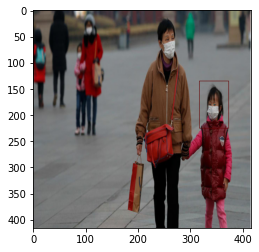

In [ ]:
import PIL
import matplotlib.pyplot as plt
plt.figure()
plt.imshow(show([],numofgrids,val=True))

To see results on val data

[[0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]]
[[4.62790718e-03 4.98743495e-03 6.71703718e-04 2.84616428e-04
  3.20373662e-03 1.22250523e-03 8.47506744e-04 1.63012196e-03
  3.01662134e-03 4.06248495e-03 3.76041583e-03 3.15097248e-04
  4.54983354e-04]
 [1.80380256e-03 1.71613763e-03 2.17191468e-04 3.88013577e-04
  1.47043879e-03 1.84479984e-04 2.03621414e-04 2.23355996e-03
  2.26761913e-04 1.84613556e-04 1.01995852e-03 9.37123201e-04
  4.33426903e-04]
 [4.96495981e-04 3.09115712e-04 3.89197754e-04 1.31451990e-03
  7.48271763e-04 3.04791960e-04 5.28233686e-05 8.11253607e-01
  8.59133026e-04 1.93444896e-04 1.41279434e-03 8.56322818e-04
  1.34756113e-03]
 [5.039710

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


[[0 0 0 0 0 1 1 0 1 1 0 0 0]
 [0 0 1 1 0 0 0 1 0 0 0 0 0]
 [0 0 0 1 0 1 1 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0 1 0 0]
 [0 1 0 0 0 0 0 1 1 0 0 0 0]
 [0 0 0 1 1 0 1 0 0 0 0 0 0]
 [0 1 0 0 1 1 0 1 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 1 1 0 0 0 1 0 1 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]]
[[4.1926731e-03 1.6386838e-03 2.0821667e-01 5.6545035e-04 1.4932906e-04
  8.9300895e-01 8.5856003e-01 6.6382356e-04 8.7271863e-01 8.8507581e-01
  6.6098582e-05 3.4475263e-04 9.2832022e-04]
 [1.6705889e-03 1.5224003e-02 8.1278622e-01 7.3813039e-01 2.7099561e-03
  2.4431432e-04 9.5230302e-05 8.6747634e-01 1.0654925e-03 1.5716779e-03
  4.9865822e-04 9.8195276e-04 4.2650718e-04]
 [5.6099996e-04 1.8055247e-04 1.1373260e-04 8.5645157e-01 3.5988705e-03
  8.8361895e-01 8.5837650e-01 6.9804414e-04 1.7781738e-03 1.0880899e-04
  7.9921313e-04 4.0688895e-04 2.8073348e-04]
 [3.3495136e-04 8.5932777e-05 1.9439618e-03 2.2661747e-

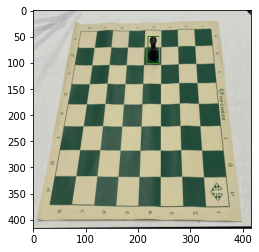

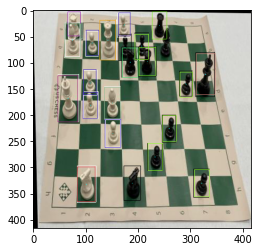

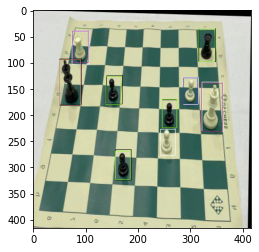

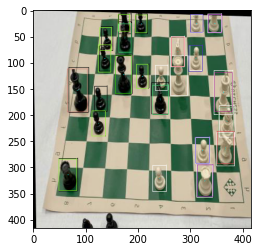

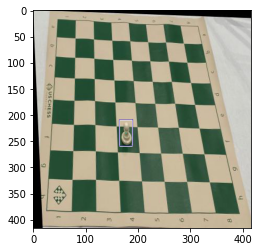

...

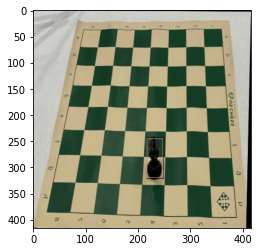

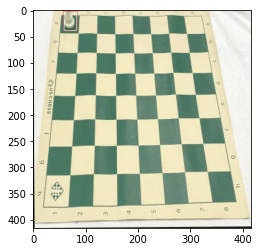

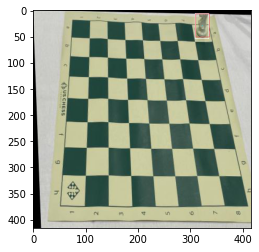

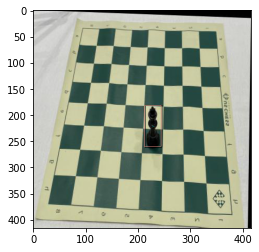

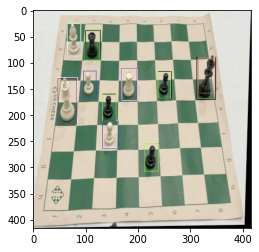

In [ ]:
import PIL
import matplotlib.pyplot as plt

for i in range(x_val.shape[0]):

  img=x_train[i,:,:,:]
  

  plt.figure()
  plt.imshow(show(img,numofgrids,val=False))

In [ ]:
color_list=(np.random.rand(12,3)*255)
color_list.astype('int16')
color_list.shape

(12, 3)

[[0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 1 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 1 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 1 0 0 1 0 0 0]
 [0 1 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]]
[[1.58554770e-03 1.31868245e-03 2.73127994e-03 3.22585599e-03
  3.00033978e-04 2.70873867e-03 4.57257092e-01 2.54599523e-04
  1.16156926e-02 2.02901452e-03 9.87149906e-05 3.81425547e-04
  8.32533929e-04]
 [9.15226992e-04 5.64421236e-04 8.70242596e-01 1.28135318e-04
  4.13959116e-01 6.55171335e-01 5.57119906e-01 5.04386699e-05
  1.44769740e-03 3.78962443e-03 4.25206934e-04 3.27883638e-04
  3.79565783e-04]
 [4.48876206e-04 1.96316440e-04 2.86574122e-02 5.55699982e-04
  7.90563464e-01 6.92478180e-01 4.18592535e-04 1.21017314e-04
  8.90163422e-01 8.96026613e-05 1.63376360e-04 4.72059794e-04
  2.61847832e-04]
 [6.454130

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


[[0 0 0 0 1 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 1 0 0 0]
 [0 0 0 0 1 1 0 1 1 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]]
[[3.50973848e-03 8.86577880e-04 5.48912678e-03 3.45849812e-01
  8.76288950e-01 3.31418612e-03 3.73753341e-04 4.33853944e-04
  3.80240177e-04 5.37325279e-04 1.74483765e-04 2.22598799e-04
  7.12905428e-04]
 [7.30438216e-04 6.73286850e-04 6.84387190e-03 4.45866521e-04
  2.92991586e-02 8.46459746e-01 3.15762591e-03 7.82377552e-04
  4.04148450e-04 1.97736290e-03 1.56905001e-03 3.39934952e-04
  2.97191582e-04]
 [4.63766133e-04 1.63200719e-04 8.87304604e-01 3.51022973e-05
  4.31950728e-04 3.26012284e-03 1.71927898e-03 1.02476857e-03
  1.86488277e-03 8.78282428e-01 1.81658706e-03 1.87250102e-04
  3.79543693e-04]
 [6.463954

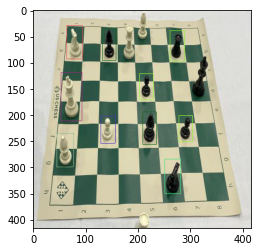

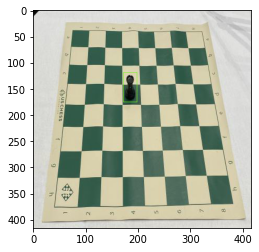

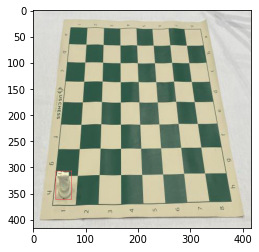

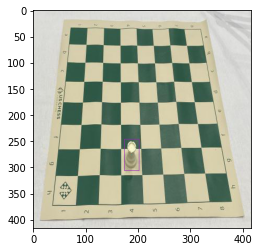

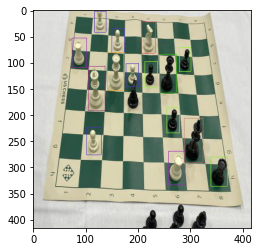

...

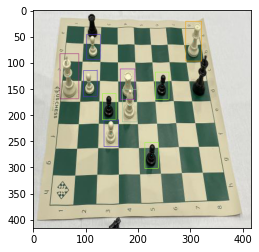

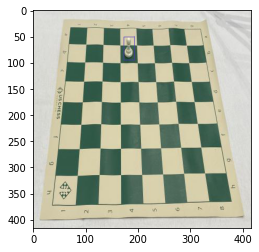

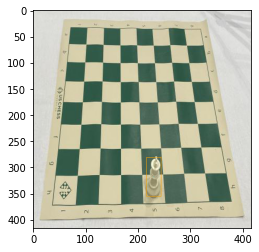

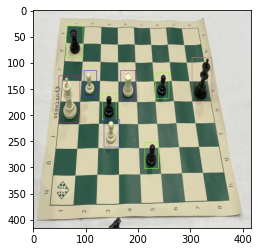

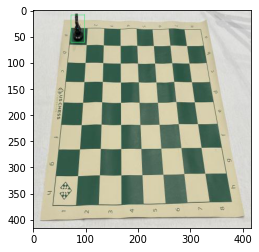

In [ ]:
import PIL
import matplotlib.pyplot as plt

for i in range(x_val.shape[0]):

  img=x_val[i,:,:,:]
  

  plt.figure()
  plt.imshow(show(img,numofgrids,val=False))

In [ ]:
# function to convert the JavaScript object into an OpenCV image
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# function to convert OpenCV Rectangle bounding box image into base64 byte string to be overlayed on video stream
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  bbox_PIL.save(iobuf, format='png')
  # format return string
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes

In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

<IPython.core.display.Javascript object>

Saved to photo.jpg


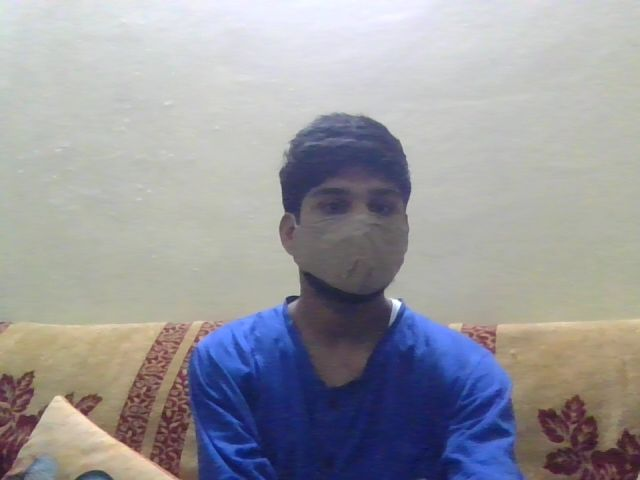

In [ ]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

[[0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]]
[[7.8087253e-04 8.3488139e-04 9.9009415e-04 1.0128451e-03 8.9726923e-04
  8.0354855e-04 8.6339464e-04 8.3468173e-04 8.5233967e-04 8.1477850e-04
  9.5767714e-04 9.2400209e-04 1.0173698e-03]
 [3.8417854e-04 5.5826892e-04 7.3587743e-04 7.2168140e-04 8.0129446e-04
  7.1567489e-04 9.4861182e-04 1.0672265e-03 7.8987645e-04 8.4890419e-04
  8.0013159e-04 5.6054350e-04 3.7304178e-04]
 [2.2828610e-04 2.3755190e-04 4.0148987e-04 4.0423480e-04 5.0370634e-04
  4.7996425e-04 3.5497861e-04 2.0706192e-04 2.5520124e-04 3.3239223e-04
  3.6853339e-04 3.1468627e-04 2.2678742e-04]
 [2.6907123e-04 2.5510977e-04 5.2593288e-04 6.9970649e-

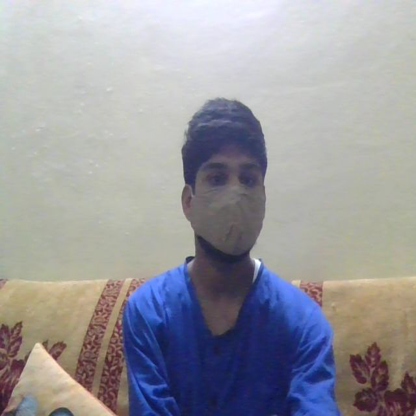

In [ ]:
from PIL import Image
img1=Image.open('photo.jpg')
img1=img1.resize((targetsize,targetsize))
img1=np.array(img1)
test=img1
Image.fromarray(show(test,numofgrids,val=False))

no.48
[[0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]]
predict
[[4.15838528e-08 2.64464319e-07 5.79785478e-07 3.02404874e-06
  1.21931066e-06 7.32832905e-10 7.05542007e-08 1.70687446e-08
  1.75915841e-06]
 [6.52408829e-08 1.12790119e-07 1.07645705e-04 2.53362505e-05
  9.18423575e-06 2.34225172e-06 2.85036367e-05 5.25046198e-06
  6.49938485e-08]
 [1.68455790e-05 9.49129026e-06 1.59857720e-02 3.40656625e-05
  1.72528427e-03 3.42382380e-04 4.94762171e-05 4.86319323e-06
  1.42467336e-08]
 [5.24294376e-03 1.54588732e-03 5.48400351e-07 2.92659261e-05
  1.97860021e-02 1.88736095e-07 1.60820535e-04 2.03261479e-07
  1.62670333e-02]
 [7.93528397e-06 9.59587807e-04 9.99377549e-01 9.23536427e-04
  4.91960160e-02 6.41520368e-04 9.99936461e-01 2.67957337e-03
  4.64836950e-04]
 [6.4

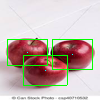

In [ ]:
c=int(input('no.'))
img=x_train[c,:,:,:]
test=img
Image.fromarray(test)

print(y_train[c,:,:,0])
print('predict')
  
test=test.reshape([1,test.shape[0],test.shape[1],test.shape[2]])
test.shape
pred=model.predict(test)
pred[0,:,:,0:3]=sigmoid(pred[0,:,:,0:3])
print(pred[0,:,:,0])
print(((pred[0,:,:,0]>0.7)*1).reshape([numofgrids,numofgrids]))

pred[...,0]=(pred[0,:,:,0]>0.7)*1
#pred[...,1:3]=sigmoid(pred[...,1:3])
pred[...,5:]=K.softmax(pred[...,5:])
test=img
for i in range(numofgrids):
  for j in range(numofgrids):
    if(pred[0,i,j,0]==1):
      print("object")
      x=j*int(targetsize/numofgrids)
      y=i*int(targetsize/numofgrids)
      print('x',x,'y',y)
      xincell=pred[0,i,j,1]*int(targetsize/numofgrids)
      yincell=pred[0,i,j,2]*int(targetsize/numofgrids)
      print('final x,y:',int(x+xincell),",",int(y+yincell))
      uppercornerx=int(x+xincell)-int(pred[0,i,j,3]*int(targetsize/numofgrids)/2)
      uppercornery=int(y+yincell)-int(pred[0,i,j,4]*int(targetsize/numofgrids)/2)
     
      lowercornerx=int(x+xincell)+int(pred[0,i,j,3]*int(targetsize/numofgrids)/2)
      lowercornery=int(y+yincell)+int(pred[0,i,j,4]*int(targetsize/numofgrids)/2)

      print('width',pred[0,i,j,3]*int(targetsize/numofgrids))
      print('height',pred[0,i,j,4]*int(targetsize/numofgrids))
      print(pred[0,i,j,5:])
      print("class ",np.argmax(pred[0,i,j,5:]))
      if (np.argmax(pred[0,i,j,5:])==1):
        rgb=[255,0,0]
      else:
        rgb=[0,255,0]
      test[K.clip(uppercornery,min_value=0,max_value=targetsize-1):K.clip(uppercornery+int(pred[0,i,j,4]*int(targetsize/numofgrids)),min_value=0,max_value=targetsize-1),K.clip(uppercornerx,min_value=0,max_value=targetsize-1),:]=rgb
      test[K.clip(lowercornery-int(pred[0,i,j,4]*int(targetsize/numofgrids)),min_value=0,max_value=targetsize-1):K.clip(lowercornery,min_value=0,max_value=targetsize-1),K.clip(lowercornerx,min_value=0,max_value=targetsize-1),:]=rgb

      test[K.clip(uppercornery,min_value=0,max_value=targetsize-1),K.clip(uppercornerx,min_value=0,max_value=targetsize-1):K.clip(uppercornerx+int(pred[0,i,j,3]*int(targetsize/numofgrids)),min_value=0,max_value=targetsize-1),:]=rgb
      test[K.clip(lowercornery,min_value=0,max_value=targetsize-1),K.clip(uppercornerx,min_value=0,max_value=targetsize-1):K.clip(uppercornerx+int(pred[0,i,j,3]*int(targetsize/numofgrids)),min_value=0,max_value=targetsize-1),:]=rgb

      

      test[K.clip(int(y+yincell),min_value=0,max_value=targetsize-1),K.clip(int(x+xincell),min_value=0,max_value=targetsize-1),:]=[0,255,255] #center
        # test[uppercornery,uppercornerx,:]=[0,0,255]
        # test[lowercornery,lowercornerx,:]=[0,0,255]
Image.fromarray(test)

In [ ]:
pred[...,3:5]

In [ ]:
# pred[0,:,:,:]

In [ ]:
x_input=layers.Input(shape=(100,100,3))
x=layers.Conv2D(32,(3,3),activation='relu')(x_input)
x=layers.MaxPooling2D((2,2))(x)
#x=layers.Dropout(0.8)(x)

x=layers.Conv2D(64,(3,3),activation='relu')(x)
x=layers.MaxPooling2D((2,2))(x)
#x=layers.Dropout(0.8)(x)

x=layers.Conv2D(64,(3,3),activation='relu')(x)
x=layers.MaxPooling2D((2,2))(x)

x=layers.Flatten()(x)
x=layers.Dropout(0.8)(x)
x=layers.Dense(25*3,activation='linear')(x)
output=layers.Reshape((5,5,3))(x)

modelpc=Model(inputs=x_input,outputs=output)
modelpc.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 100, 100, 3)]     0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 98, 98, 32)        896       
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 49, 49, 32)        0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 47, 47, 64)        18496     
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 23, 23, 64)        0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 21, 21, 64)        36928     
_________________________________________________________________
max_pooling2d_17 (MaxPooling (None, 10, 10, 64)        0   

In [ ]:
def pc_loss2(y_true,y_pred):
  obj=y_true[...,0]==1            #index of cells which have objects
  noobj=y_true[...,0]==0
  print("true",y_true.shape,'pred',y_pred.shape)
  obj_loss=K.binary_crossentropy(y_true[...,0][obj], y_pred[...,0][obj],from_logits=True)

  noobj_loss=K.binary_crossentropy(y_true[...,0][noobj], y_pred[...,0][noobj],from_logits=True)
  class_loss=K.categorical_crossentropy(y_true[...,1:][obj],y_pred[...,1:][obj],from_logits=True)
  #class_loss=K.mean(K.square(y_true[...,1:][obj] - y_pred[...,1:][obj]), axis=-1)
  #class_loss=K.binary_crossentropy(y_true[...,1:], y_pred[...,1:],from_logits=True)
  noobjval=1
  objval=1
  classval=0
  #return ((classval*class_loss)+(objval*obj_loss))
  obj_loss_single=tf.reduce_mean(obj_loss)
  noobj_loss_single=tf.reduce_mean(noobj_loss)
  class_loss_single=tf.reduce_mean(class_loss)
  tf.print('objloss',obj_loss_single)
  tf.print('noobjloss',noobj_loss_single)
  return ((objval*obj_loss_single)+(noobjval*noobj_loss_single)+(classval*class_loss_single))

In [ ]:
def loss_function(y_true, y_pred):
  obj=y_true==1            #index of cells which have objects
  noobj=y_true==0          #index of cells which does not have objects
  #print(y_true)
  # objarr=(obj)*1
  # noobjarr=np.array(noobj)*1
  # obj_mask=K.variable(objarr)
  # noobj_mask=K.variable(noobjarr)
  obj_mask=tf.cast(obj,dtype='float32')
  noobj_mask=tf.cast(noobj,dtype='float32')
  #print(obj_mask)
  #print(noobj_mask)
  #print("obj",obj,'noobj',noobj)
  #bj_loss=K.binary_crossentropy(y_true[obj], y_pred[obj],from_logits=True)
  obj_loss=K.binary_crossentropy(y_true*obj_mask, y_pred*obj_mask,from_logits=True)

  #noobj_loss=K.binary_crossentropy(y_true[noobj], y_pred[noobj],from_logits=True)
  noobj_loss=K.binary_crossentropy(y_true*noobj_mask, y_pred*noobj_mask,from_logits=True)
  #print(y_true[noobj])
  return obj_loss

In [ ]:
from keras import backend as K
def anne(y_true,y_pred):
  return K.binary_crossentropy(y_true[...,0], y_pred[...,0],from_logits=True)

In [ ]:
y_train[0:2,:,:,0,None].shape

(2, 5, 5, 1)

In [ ]:
loss_function(K.variable(y_train[0:2,:,:,0].reshape([-1,25])),K.variable(y_train[2:4,:,:,0].reshape([-1,25])))

<tf.Tensor: shape=(2, 25), dtype=float32, numpy=
array([[0.6931472, 0.6931472, 0.6931472, 0.6931472, 0.6931472, 0.6931472,
        0.6931472, 0.6931472, 0.6931472, 0.6931472, 0.6931472, 0.6931472,
        0.6931472, 0.6931472, 0.6931472, 0.6931472, 0.6931472, 0.6931472,
        0.6931472, 0.6931472, 0.6931472, 0.6931472, 0.6931472, 0.6931472,
        0.6931472],
       [0.6931472, 0.6931472, 0.6931472, 0.6931472, 0.6931472, 0.6931472,
        0.6931472, 0.3132617, 0.3132617, 0.6931472, 0.6931472, 0.6931472,
        0.6931472, 0.6931472, 0.6931472, 0.6931472, 0.3132617, 0.6931472,
        0.6931472, 0.6931472, 0.6931472, 0.6931472, 0.6931472, 0.6931472,
        0.6931472]], dtype=float32)>

In [ ]:
np.concatenate([y_train[0:2,:,:,0:1],y_train[0:2,:,:,5:]],axis=-1).shape
np.concatenate([y_train[2:4,:,:,0:1],y_train[2:4,:,:,5:]],axis=-1).shape

(2, 5, 5, 3)

In [ ]:
pc_loss2(K.variable(np.concatenate([y_train[0:2,:,:,0:1],y_train[0:2,:,:,5:]],axis=-1)),K.variable(np.concatenate([y_train[2:4,:,:,0:1],y_train[2:4,:,:,5:]],axis=-1)))

true (2, 5, 5, 3) pred (2, 5, 5, 3)
objloss 0.566518724
noobjloss 0.768770933


<tf.Tensor: shape=(), dtype=float32, numpy=1.3352897>

In [ ]:
#modelpc.compile(loss=anne,optimizer='adam')
modelpc.compile(loss=pc_loss2,optimizer='adam')

In [ ]:
#y_train[:,:,:,0].reshape([-1,25]).shape
np.concatenate([y_train[:,:,:,0:1],y_train[:,:,:,5:]],axis=-1).shape

(563, 5, 5, 3)

In [ ]:
modelpc.fit(x=x_train,y=np.concatenate([y_train[:,:,:,0:1],y_train[:,:,:,5:]],axis=-1),validation_data=(x_val,np.concatenate([y_val[:,:,:,0:1],y_val[:,:,:,5:]],axis=-1)),batch_size=64,epochs=100)

Epoch 1/100
true (None, 5, 5, 3) pred (None, 5, 5, 3)
true (None, 5, 5, 3) pred (None, 5, 5, 3)
objloss 36.1534081
noobjloss 36.9693718
1/9 [==>...........................] - ETA: 18s - loss: 73.1228objloss 22.8330498
noobjloss 14.1670542
2/9 [=====>........................] - ETA: 6s - loss: 64.0921 objloss 13.4083643
noobjloss 6.66248226
3/9 [=========>....................] - ETA: 5s - loss: 57.1940objloss 7.78561592
noobjloss 4.10832167
4/9 [============>.................] - ETA: 4s - loss: 51.7760objloss 4.01395416
noobjloss 2.23786688
5/9 [===============>..............] - ETA: 3s - loss: 47.3544objloss 2.17022943
noobjloss 1.51055944
6/9 [===================>..........] - ETA: 2s - loss: 43.6848objloss 1.62572122
noobjloss 1.09376025
7/9 [======================>.......] - ETA: 1s - loss: 40.6020objloss 1.14223564
noobjloss 0.855054319
8/9 [=========================>....] - ETA: 0s - loss: 37.9758objloss 0.866704047
noobjloss 0.726500392
9/9 [==============================] - ETA:

KeyboardInterrupt: ignored

no.9


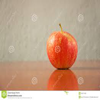

In [ ]:
c=int(input('no.'))
test=x_val[c,:,:,:]
Image.fromarray(test)

In [ ]:
print(y_val[c,:,:,0])
print('predicted')
test=test.reshape([1,test.shape[0],test.shape[1],test.shape[2]])
test.shape
pred=modelpc.predict(test)
print(pred.shape)
pred=sigmoid(pred)

print(np.round(pred[0,:,:,0].reshape([5,5]),decimals=5))
print(((pred[0,:,:,0]>0.5)*1).reshape([5,5]))

[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
predicted
(1, 5, 5, 3)
[[0.46191 0.46806 0.46487 0.47348 0.46302]
 [0.47444 0.51825 0.53377 0.52357 0.48414]
 [0.49717 0.53562 0.54107 0.53766 0.49957]
 [0.47683 0.53072 0.53331 0.53038 0.48025]
 [0.46393 0.4716  0.46802 0.47084 0.46249]]
[[0 0 0 0 0]
 [0 1 1 1 0]
 [0 1 1 1 0]
 [0 1 1 1 0]
 [0 0 0 0 0]]


In [ ]:
mask=(pred[0,:,:,0]>0.5)
pred[0,:,:,0]=(pred[0,:,:,0]>0.5)*1
(pred[0,:,:,:]>0.5)*1

In [ ]:
np.concatenate([y_val[c,:,:,0:1],y_val[c,:,:,5:]],axis=-1)